# Imports

In [1]:
import os
import json
import re
import numpy as np
import pandas as pd
import torch
from torch import nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import models, transforms
from transformers import ViTModel, GPT2LMHeadModel, GPT2TokenizerFast
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt
import nltk
from collections import Counter

# Data Proprocessing

In [2]:
train_data_csv = pd.read_csv('/Users/ishanbansal/Desktop/columbia/dl_for_cv/hw5/MEDIC/MEDIC_train.csv')
train_data_csv.head()

,image_id,event_name,image_path,damage_severity,informative,humanitarian,disaster_types
0,ASONAM2017,ecuador_eq_severe_im_645.jpg,data/ASONAM17_Damage_Image_Dataset/ecuador_eq/...,severe,informative,infrastructure_and_utility_damage,earthquake
1,ASONAM2017,ecuador_eq_severe_im_1378.jpg,data/ASONAM17_Damage_Image_Dataset/ecuador_eq/...,severe,informative,infrastructure_and_utility_damage,earthquake
2,ASONAM2017,ecuador_eq_unlabelled_im_100.jpg,data/ASONAM17_Damage_Image_Dataset/ecuador_eq/...,little_or_none,not_informative,not_humanitarian,earthquake
3,ASONAM2017,ecuador_eq_mild_im_2573.jpg,data/ASONAM17_Damage_Image_Dataset/ecuador_eq/...,mild,informative,affected_injured_or_dead_people,earthquake
4,ASONAM2017,ecuador_eq_unlabelled_im_828.jpg,data/ASONAM17_Damage_Image_Dataset/ecuador_eq/...,little_or_none,informative,rescue_volunteering_or_donation_effort,earthquake


In [3]:
train_data_csv.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49353 entries, 0 to 49352
Data columns (total 7 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   image_id         49353 non-null  object
 1   event_name       49353 non-null  object
 2   image_path       49353 non-null  object
 3   damage_severity  49353 non-null  object
 4   informative      49353 non-null  object
 5   humanitarian     49353 non-null  object
 6   disaster_types   49353 non-null  object
dtypes: object(7)
memory usage: 2.6+ MB


In [4]:
df = train_data_csv[train_data_csv['image_id'] == "damage_multimodal"]

In [5]:
df

,image_id,event_name,image_path,damage_severity,informative,humanitarian,disaster_types
19663,damage_multimodal,flood/images/floodwater_2017-06-24_03-18-10.jpg,data/multimodal-deep-learning-disaster-respons...,mild,informative,infrastructure_and_utility_damage,flood
19664,damage_multimodal,damaged_infrastructure/images/destroyedbuildin...,data/multimodal-deep-learning-disaster-respons...,little_or_none,informative,infrastructure_and_utility_damage,other_disaster
19665,damage_multimodal,damaged_infrastructure/images/earthquake_2017-...,data/multimodal-deep-learning-disaster-respons...,severe,informative,affected_injured_or_dead_people,other_disaster
19666,damage_multimodal,fires/images/buildingfire_2017-10-05_22-47-29.jpg,data/multimodal-deep-learning-disaster-respons...,severe,informative,infrastructure_and_utility_damage,fire
19667,damage_multimodal,flood/images/floodwater_2017-07-28_23-04-54.jpg,data/multimodal-deep-learning-disaster-respons...,little_or_none,informative,infrastructure_and_utility_damage,flood
...,...,...,...,...,...,...,...
23410,damage_multimodal,flood/images/floodwater_2017-08-27_23-46-02.jpg,data/multimodal-deep-learning-disaster-respons...,severe,informative,infrastructure_and_utility_damage,flood
23411,damage_multimodal,damaged_nature/images/windstorm_2017-11-14_06-...,data/multimodal-deep-learning-disaster-respons...,little_or_none,informative,infrastructure_and_utility_damage,fire
23412,damage_multimodal,non_damage/images/ad_2017-11-25_06-19-51.jpg,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_informative,not_humanitarian,not_disaster
23413,damage_multimodal,non_damage/images/ad_2017-11-25_08-54-36.jpg,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_informative,not_humanitarian,not_disaster


In [6]:
df = df.drop(columns=['image_id', 'event_name', 'informative'])

In [7]:
df

,image_path,damage_severity,humanitarian,disaster_types
19663,data/multimodal-deep-learning-disaster-respons...,mild,infrastructure_and_utility_damage,flood
19664,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,other_disaster
19665,data/multimodal-deep-learning-disaster-respons...,severe,affected_injured_or_dead_people,other_disaster
19666,data/multimodal-deep-learning-disaster-respons...,severe,infrastructure_and_utility_damage,fire
19667,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,flood
...,...,...,...,...
23410,data/multimodal-deep-learning-disaster-respons...,severe,infrastructure_and_utility_damage,flood
23411,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,fire
23412,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_humanitarian,not_disaster
23413,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_humanitarian,not_disaster


In [8]:
df['combined_info'] = df.apply(
    lambda row: f"Damage severity is {row['damage_severity']} and humanitarian damage type is {row['humanitarian']}. It is a {row['disaster_types']} disaster.", 
    axis=1
)

In [9]:
df

,image_path,damage_severity,humanitarian,disaster_types,combined_info
19663,data/multimodal-deep-learning-disaster-respons...,mild,infrastructure_and_utility_damage,flood,Damage severity is mild and humanitarian damag...
19664,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,other_disaster,Damage severity is little_or_none and humanita...
19665,data/multimodal-deep-learning-disaster-respons...,severe,affected_injured_or_dead_people,other_disaster,Damage severity is severe and humanitarian dam...
19666,data/multimodal-deep-learning-disaster-respons...,severe,infrastructure_and_utility_damage,fire,Damage severity is severe and humanitarian dam...
19667,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,flood,Damage severity is little_or_none and humanita...
...,...,...,...,...,...
23410,data/multimodal-deep-learning-disaster-respons...,severe,infrastructure_and_utility_damage,flood,Damage severity is severe and humanitarian dam...
23411,data/multimodal-deep-learning-disaster-respons...,little_or_none,infrastructure_and_utility_damage,fire,Damage severity is little_or_none and humanita...
23412,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...
23413,data/multimodal-deep-learning-disaster-respons...,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...


In [10]:
unique_values = {column: df[column].unique() for column in df.columns}
unique_values

{'image_path': array(['data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/flood/images/floodwater_2017-06-24_03-18-10.jpg',
        'data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/damaged_infrastructure/images/destroyedbuilding_2017-05-18_09-11-14.jpg',
        'data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/damaged_infrastructure/images/earthquake_2017-11-13_23-25-16.jpg',
        ...,
        'data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/non_damage/images/ad_2017-11-25_06-19-51.jpg',
        'data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/non_damage/images/ad_2017-11-25_08-54-36.jpg',
        'data/multimodal-deep-learning-disaster-response-mouzannar/multimodal/damaged_infrastructure/images/sandydamage_2014-12-02_09-41-43.jpg'],
       dtype=object),
 'damage_severity': array(['mild', 'little_or_none', 'severe'], dtype=object),
 'humanitarian': array(['infrastructure_and_utilit

In [ ]:
import os
import shutil
from pathlib import Path
output_folder = "images"
os.makedirs(output_folder, exist_ok=True)
for image_path in df['image_path']:
    try:
        file_name = os.path.basename(image_path)
        destination = os.path.join(output_folder, file_name)
        shutil.copy(image_path, destination)
    except FileNotFoundError:
        print(f"File not found: {image_path}")
    except Exception as e:
        print(f"Error processing {image_path}: {e}")
print("Images have been successfully copied to the 'images' folder.")

Images have been successfully copied to the 'images' folder.


In [12]:
df['image_path'] = df['image_path'].apply(lambda x: os.path.basename(x))

In [13]:
df

,image_path,damage_severity,humanitarian,disaster_types,combined_info
19663,floodwater_2017-06-24_03-18-10.jpg,mild,infrastructure_and_utility_damage,flood,Damage severity is mild and humanitarian damag...
19664,destroyedbuilding_2017-05-18_09-11-14.jpg,little_or_none,infrastructure_and_utility_damage,other_disaster,Damage severity is little_or_none and humanita...
19665,earthquake_2017-11-13_23-25-16.jpg,severe,affected_injured_or_dead_people,other_disaster,Damage severity is severe and humanitarian dam...
19666,buildingfire_2017-10-05_22-47-29.jpg,severe,infrastructure_and_utility_damage,fire,Damage severity is severe and humanitarian dam...
19667,floodwater_2017-07-28_23-04-54.jpg,little_or_none,infrastructure_and_utility_damage,flood,Damage severity is little_or_none and humanita...
...,...,...,...,...,...
23410,floodwater_2017-08-27_23-46-02.jpg,severe,infrastructure_and_utility_damage,flood,Damage severity is severe and humanitarian dam...
23411,windstorm_2017-11-14_06-53-44.jpg,little_or_none,infrastructure_and_utility_damage,fire,Damage severity is little_or_none and humanita...
23412,ad_2017-11-25_06-19-51.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...
23413,ad_2017-11-25_08-54-36.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...


In [14]:
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [15]:
df

,image_path,damage_severity,humanitarian,disaster_types,combined_info
19663,floodwater_2017-06-24_03-18-10.jpg,mild,infrastructure_and_utility_damage,flood,Damage severity is mild and humanitarian damag...
19664,destroyedbuilding_2017-05-18_09-11-14.jpg,little_or_none,infrastructure_and_utility_damage,other_disaster,Damage severity is little_or_none and humanita...
19665,earthquake_2017-11-13_23-25-16.jpg,severe,affected_injured_or_dead_people,other_disaster,Damage severity is severe and humanitarian dam...
19666,buildingfire_2017-10-05_22-47-29.jpg,severe,infrastructure_and_utility_damage,fire,Damage severity is severe and humanitarian dam...
19667,floodwater_2017-07-28_23-04-54.jpg,little_or_none,infrastructure_and_utility_damage,flood,Damage severity is little_or_none and humanita...
...,...,...,...,...,...
23410,floodwater_2017-08-27_23-46-02.jpg,severe,infrastructure_and_utility_damage,flood,Damage severity is severe and humanitarian dam...
23411,windstorm_2017-11-14_06-53-44.jpg,little_or_none,infrastructure_and_utility_damage,fire,Damage severity is little_or_none and humanita...
23412,ad_2017-11-25_06-19-51.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...
23413,ad_2017-11-25_08-54-36.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...


In [16]:
df.to_csv('data.csv')

# Generating Captions

In [17]:
df = pd.read_csv('data.csv')

In [18]:
df['combined_entry'] = df.apply(
    lambda row: f"{row['image_path']}, {row['combined_info']}", axis=1
)

In [19]:
df

,Unnamed: 0,image_path,damage_severity,humanitarian,disaster_types,combined_info,combined_entry
0,19663,floodwater_2017-06-24_03-18-10.jpg,mild,infrastructure_and_utility_damage,flood,Damage severity is mild and humanitarian damag...,"floodwater_2017-06-24_03-18-10.jpg, Damage sev..."
1,19664,destroyedbuilding_2017-05-18_09-11-14.jpg,little_or_none,infrastructure_and_utility_damage,other_disaster,Damage severity is little_or_none and humanita...,"destroyedbuilding_2017-05-18_09-11-14.jpg, Dam..."
2,19665,earthquake_2017-11-13_23-25-16.jpg,severe,affected_injured_or_dead_people,other_disaster,Damage severity is severe and humanitarian dam...,"earthquake_2017-11-13_23-25-16.jpg, Damage sev..."
3,19666,buildingfire_2017-10-05_22-47-29.jpg,severe,infrastructure_and_utility_damage,fire,Damage severity is severe and humanitarian dam...,"buildingfire_2017-10-05_22-47-29.jpg, Damage s..."
4,19667,floodwater_2017-07-28_23-04-54.jpg,little_or_none,infrastructure_and_utility_damage,flood,Damage severity is little_or_none and humanita...,"floodwater_2017-07-28_23-04-54.jpg, Damage sev..."
...,...,...,...,...,...,...,...
2444,23410,floodwater_2017-08-27_23-46-02.jpg,severe,infrastructure_and_utility_damage,flood,Damage severity is severe and humanitarian dam...,"floodwater_2017-08-27_23-46-02.jpg, Damage sev..."
2445,23411,windstorm_2017-11-14_06-53-44.jpg,little_or_none,infrastructure_and_utility_damage,fire,Damage severity is little_or_none and humanita...,"windstorm_2017-11-14_06-53-44.jpg, Damage seve..."
2446,23412,ad_2017-11-25_06-19-51.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...,"ad_2017-11-25_06-19-51.jpg, Damage severity is..."
2447,23413,ad_2017-11-25_08-54-36.jpg,little_or_none,not_humanitarian,not_disaster,Damage severity is little_or_none and humanita...,"ad_2017-11-25_08-54-36.jpg, Damage severity is..."


In [20]:
df = df.drop(columns=['image_path', 'damage_severity', 'humanitarian', 'disaster_types', 'combined_info'])

In [21]:
df

,Unnamed: 0,combined_entry
0,19663,"floodwater_2017-06-24_03-18-10.jpg, Damage sev..."
1,19664,"destroyedbuilding_2017-05-18_09-11-14.jpg, Dam..."
2,19665,"earthquake_2017-11-13_23-25-16.jpg, Damage sev..."
3,19666,"buildingfire_2017-10-05_22-47-29.jpg, Damage s..."
4,19667,"floodwater_2017-07-28_23-04-54.jpg, Damage sev..."
...,...,...
2444,23410,"floodwater_2017-08-27_23-46-02.jpg, Damage sev..."
2445,23411,"windstorm_2017-11-14_06-53-44.jpg, Damage seve..."
2446,23412,"ad_2017-11-25_06-19-51.jpg, Damage severity is..."
2447,23413,"ad_2017-11-25_08-54-36.jpg, Damage severity is..."


In [22]:
df = df.loc[:, ~df.columns.str.contains('^Unnamed')]

In [23]:
df

,combined_entry
0,"floodwater_2017-06-24_03-18-10.jpg, Damage sev..."
1,"destroyedbuilding_2017-05-18_09-11-14.jpg, Dam..."
2,"earthquake_2017-11-13_23-25-16.jpg, Damage sev..."
3,"buildingfire_2017-10-05_22-47-29.jpg, Damage s..."
4,"floodwater_2017-07-28_23-04-54.jpg, Damage sev..."
...,...
2444,"floodwater_2017-08-27_23-46-02.jpg, Damage sev..."
2445,"windstorm_2017-11-14_06-53-44.jpg, Damage seve..."
2446,"ad_2017-11-25_06-19-51.jpg, Damage severity is..."
2447,"ad_2017-11-25_08-54-36.jpg, Damage severity is..."


In [24]:
df['combined_entry'].to_csv('raw_captions.txt', index=False, header=False)

In [25]:
with open('raw_captions.txt', 'r') as file:
    content = file.readlines()

processed_content = [line.strip().strip('"') + '\n' for line in content]

with open('captions.txt', 'w') as processed_file:
    processed_file.writelines(processed_content)


# LSTM-RNN

In [2]:
embed_size = 256
hidden_size = 512
num_layers = 1
batch_size = 32
num_epochs = 10
learning_rate = 0.001
max_len = 20 
min_word_freq = 5 

In [3]:
data_dir = "images/"       
captions_file = "captions.txt" 
save_model_path = "model_multimodal.pth" 

In [4]:
class Vocabulary:
    def __init__(self, freq_threshold):
        self.freq_threshold = freq_threshold
        self.itos = {0: "<pad>", 1: "<start>", 2: "<end>", 3: "<unk>"}
        self.stoi = {"<pad>":0, "<start>":1, "<end>":2, "<unk>":3}
        self.index = 4

    def __len__(self):
        return len(self.itos)

    def tokenizer(self, text):
        text = text.lower()
        text = re.sub(r"[^a-zA-Z0-9\s]", "", text)
        tokens = text.strip().split()
        return tokens

    def build_vocabulary(self, sentence_list):
        frequencies = Counter()
        for sentence in sentence_list:
            tokens = self.tokenizer(sentence)
            frequencies.update(tokens)
        for word, freq in frequencies.items():
            if freq >= self.freq_threshold:
                self.stoi[word] = self.index
                self.itos[self.index] = word
                self.index += 1

    def numericalize(self, text):
        tokenized_text = self.tokenizer(text)
        return [self.stoi.get(token, self.stoi["<unk>"]) for token in tokenized_text]

In [5]:
class CaptionDataset(Dataset):
    def __init__(self, data_dir, captions_file, vocab, transform=None):
        self.data_dir = data_dir
        self.vocab = vocab
        self.transform = transform

        # Read the captions file
        self.imgs = []
        self.captions = []
        with open(captions_file, 'r') as f:
            lines = f.readlines()
        for line in lines:
            line = line.strip()
            if line:
                img, cap = line.split(",", 1)
                img = img.strip()
                cap = cap.strip()
                self.imgs.append(img)
                self.captions.append(cap)

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_name = self.imgs[idx]
        caption = self.captions[idx]
        
        img_path = os.path.join(self.data_dir, img_name)
        image = Image.open(img_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        # Numericalize caption
        numericalized_caption = [self.vocab.stoi["<start>"]]
        numericalized_caption += self.vocab.numericalize(caption)
        numericalized_caption.append(self.vocab.stoi["<end>"])

        # Pad/truncate caption to max_len
        if len(numericalized_caption) < max_len:
            numericalized_caption += [self.vocab.stoi["<pad>"]] * (max_len - len(numericalized_caption))
        else:
            numericalized_caption = numericalized_caption[:max_len]

        return image, torch.tensor(numericalized_caption)

In [6]:
def collate_fn(batch):
    images = []
    captions = []
    for img, cap in batch:
        images.append(img.unsqueeze(0))
        captions.append(cap.unsqueeze(0))
    images = torch.cat(images, dim=0)
    captions = torch.cat(captions, dim=0)
    return images, captions


In [7]:
all_captions = []
with open(captions_file, 'r') as f:
    for line in f:
        line = line.strip()
        if line:
            img, cap = line.split(",", 1)
            all_captions.append(cap.strip())

vocab = Vocabulary(freq_threshold=min_word_freq)
vocab.build_vocabulary(all_captions)

In [8]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])


In [9]:
dataset = CaptionDataset(data_dir, captions_file, vocab, transform=transform)
data_loader = DataLoader(dataset=dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

In [10]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet18(pretrained=True)
        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.linear = nn.Linear(resnet.fc.in_features, embed_size)
        self.bn = nn.BatchNorm1d(embed_size)

        for param in self.resnet.parameters():
            param.requires_grad = False  # freeze resnet weights

    def forward(self, images):
        with torch.no_grad():
            features = self.resnet(images) 
        features = features.view(features.size(0), -1)  
        features = self.linear(features)  
        features = self.bn(features)   
        return features

In [11]:
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, vocab_size)
        self.init_weights()

    def init_weights(self):
        self.embedding.weight.data.uniform_(-0.1, 0.1)
        self.fc.bias.data.fill_(0)
        self.fc.weight.data.uniform_(-0.1, 0.1)

    def forward(self, features, captions):
        embeddings = self.embedding(captions) 
        features = features.unsqueeze(1)       
        inputs = torch.cat((features, embeddings), dim=1)  
        outputs, _ = self.lstm(inputs)
        outputs = self.fc(outputs)
        
        return outputs

In [12]:
device = 'mps' if torch.mps.is_available() else 'cpu'

In [13]:
device

'mps'

In [ ]:
encoder = EncoderCNN().to(device)
decoder = DecoderRNN(embed_size, hidden_size, len(vocab), num_layers=num_layers).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=vocab.stoi["<pad>"])
params = list(decoder.parameters()) + list(encoder.linear.parameters()) + list(encoder.bn.parameters())
optimizer = optim.Adam(params, lr=learning_rate)

In [ ]:
for epoch in range(num_epochs):
    encoder.train()
    decoder.train()
    total_loss = 0
    for i, (images, captions) in enumerate(data_loader):
        images, captions = images.to(device), captions.to(device)
        # Forward
        features = encoder(images)
        outputs = decoder(features, captions[:, :-1])  # predict next word, so input all but last
        # outputs: [batch, max_len, vocab_size] (since we added features in front, it’s 1+max_len, we use outputs[:, 1:, :] for caption words)
        # We want to predict captions[:, 1:] from outputs[:, 1:, :]
        # outputs shape is [batch, 1+max_len, vocab_size], first token is generated from image
        # targets are captions[:, 1:] (excluding the start token)
        loss = criterion(outputs[:, 1:, :].reshape(-1, len(vocab)), captions[:, 1:].reshape(-1))

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
    avg_loss = total_loss / len(data_loader)
    print(f"Epoch [{epoch+1}/{num_epochs}], Loss: {avg_loss:.4f}")

# Save model
torch.save({
    'encoder': encoder.state_dict(),
    'decoder': decoder.state_dict(),
    'vocab': vocab.stoi
}, save_model_path)

Epoch [1/10], Loss: 0.9771
Epoch [2/10], Loss: 0.1098
Epoch [3/10], Loss: 0.0890
Epoch [4/10], Loss: 0.0821
Epoch [5/10], Loss: 0.0815
Epoch [6/10], Loss: 0.0730
Epoch [7/10], Loss: 0.0707
Epoch [8/10], Loss: 0.0624
Epoch [9/10], Loss: 0.0579
Epoch [10/10], Loss: 0.0543


In [ ]:
def greedy_decode(image_path, encoder, decoder, vocab, max_len=20):
    encoder.eval()
    decoder.eval()
    transform_eval = transforms.Compose([
        transforms.Resize((224,224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485,0.456,0.406],
                             std=[0.229,0.224,0.225])
    ])

    image = Image.open(image_path).convert("RGB")
    image = transform_eval(image).unsqueeze(0).to(device)

    with torch.no_grad():
        features = encoder(image) 
        
        # Start token
        start_token = vocab.stoi["<start>"]
        end_token = vocab.stoi["<end>"]
        
        sampled_indices = [start_token]
        for _ in range(max_len):
            input_ids = torch.tensor([sampled_indices], device=device) 
            outputs = decoder(features, input_ids) 
            # We only need the last timestep
            logits = outputs[:, -1, :]
            predicted = torch.argmax(logits, dim=-1).item()
            if predicted == end_token:
                break
            sampled_indices.append(predicted)
        
        # Convert indices to words
        words = []
        for idx in sampled_indices[1:]:  # skip <start>
            if idx == end_token:
                break
            words.append(vocab.itos[idx])
        
    return " ".join(words)

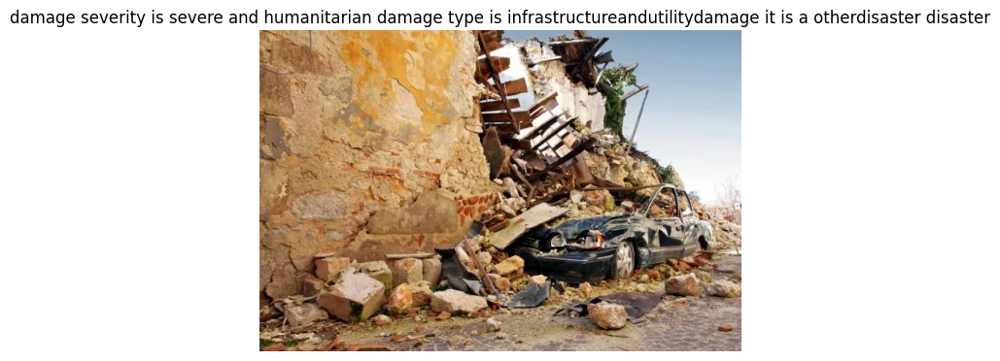

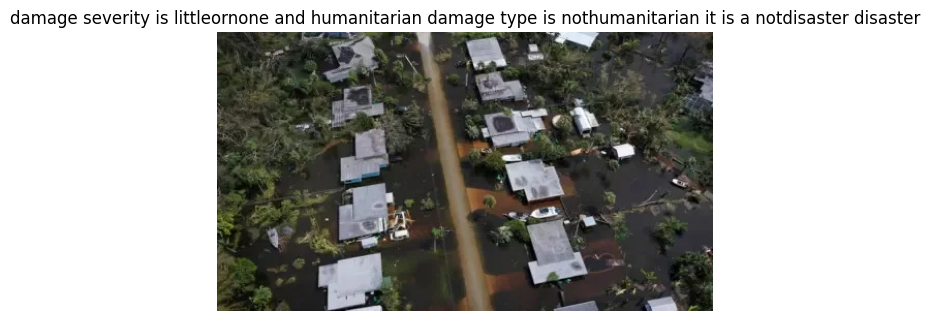

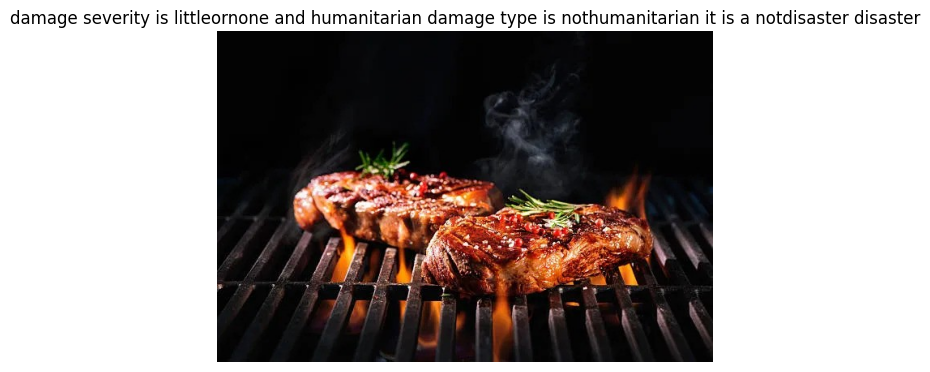

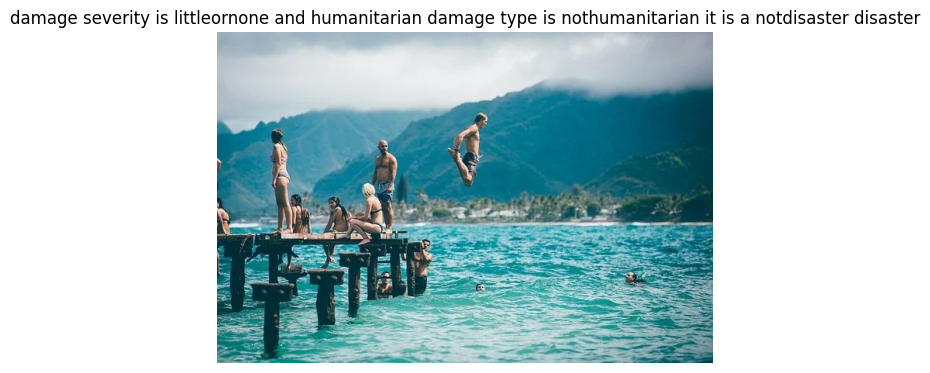

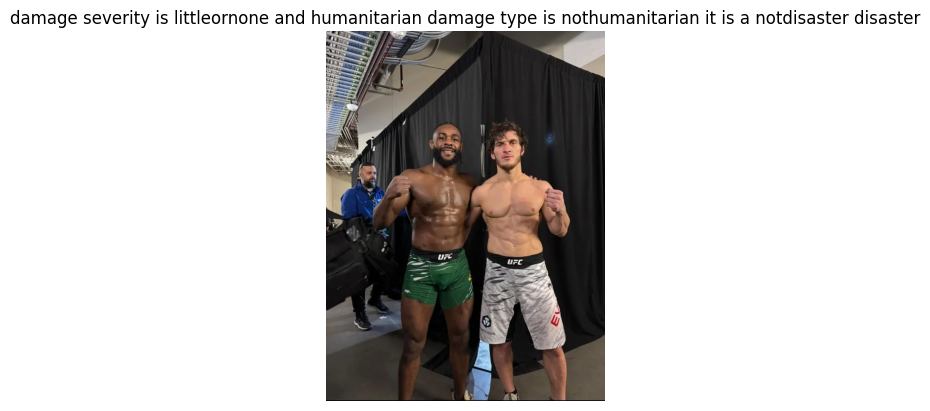

...

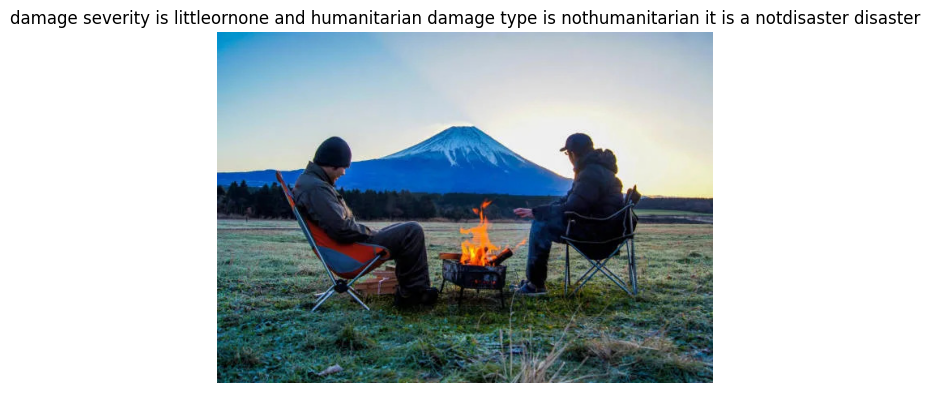

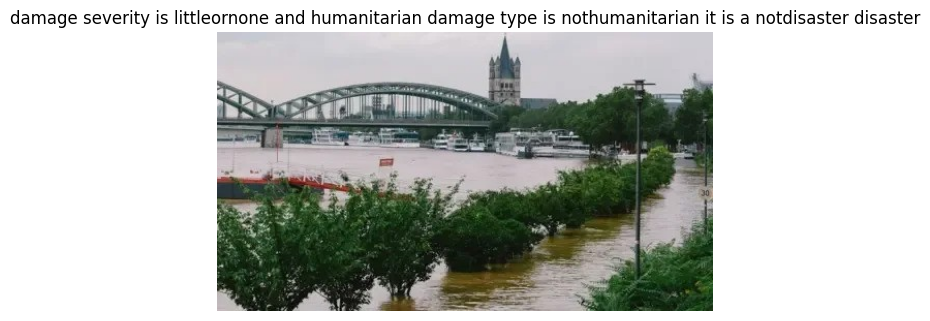

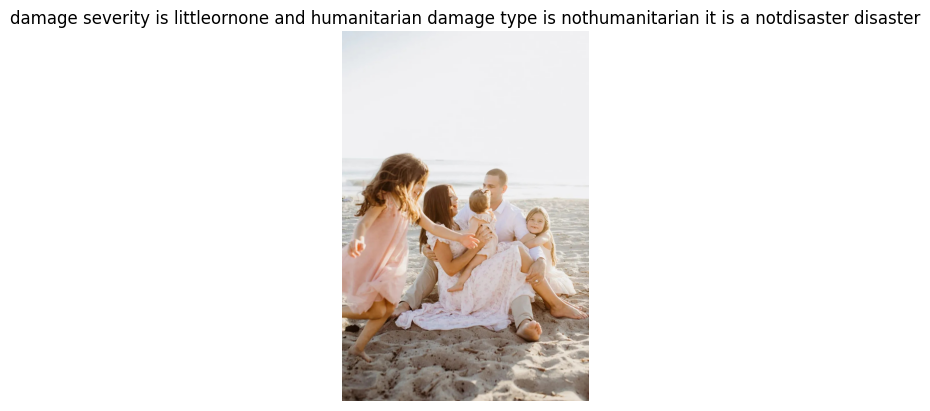

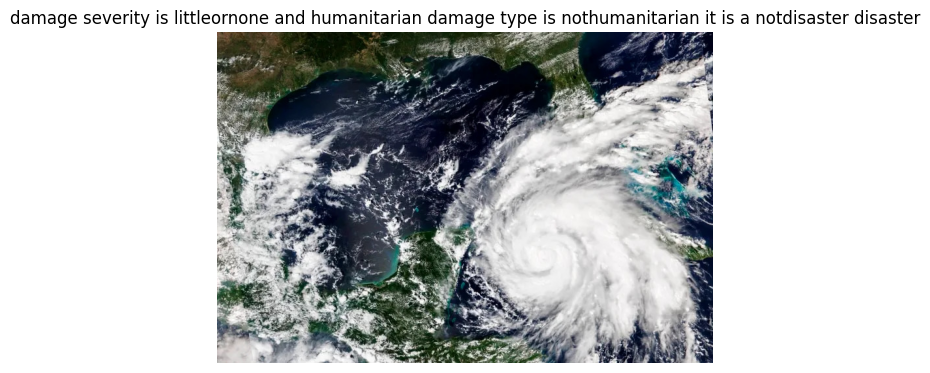

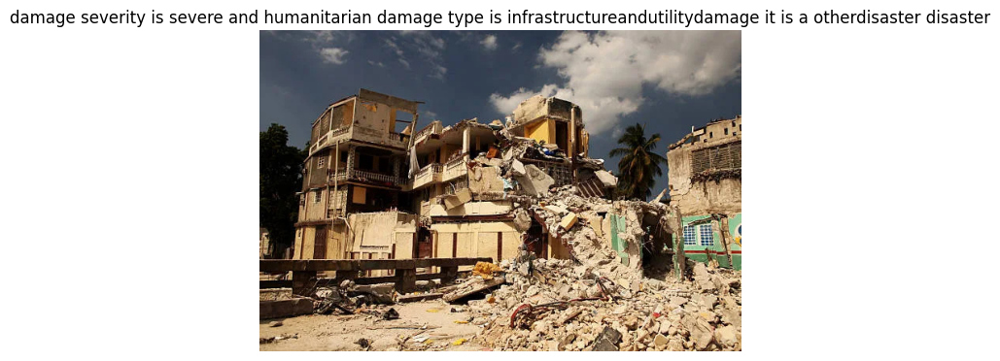

In [17]:
test_dir = "test_images" 

# Ensure model is in eval mode
encoder.eval()
decoder.eval()

for filename in os.listdir(test_dir):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
        image_path = os.path.join(test_dir, filename)
        caption = greedy_decode(image_path, encoder, decoder, vocab, max_len=20)
        image = Image.open(image_path)
        plt.imshow(image)
        plt.title(caption)
        plt.axis('off')
        plt.show()

In [20]:
test_dataset = CaptionDataset('images_test', 'test_captions.txt', vocab, transform=transform)
test_loader = DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

In [ ]:
import math
encoder.eval()
decoder.eval()

test_loss = 0.0
num_batches = 0
vocab_size = len(vocab) 

with torch.no_grad():
    for images, captions in test_loader:
        images = images.to(device)
        captions = captions.to(device)
        # Forward pass through encoder and decoder
        features = encoder(images)
        outputs = decoder(features, captions[:, :-1])  
        targets = captions[:, 1:]  # shift by one to align with predictions
        # Compute loss
        loss = criterion(outputs[:, 1:, :].reshape(-1, vocab_size),
                         targets.reshape(-1))
        test_loss += loss.item()
        num_batches += 1

# Average loss across the test set
avg_loss = test_loss / num_batches
# Compute perplexity
perplexity = math.exp(avg_loss)
print("Test Perplexity: ", perplexity)

Test Perplexity:  1.1334422876100585


# VIT-GPT2

In [2]:
IMG_SIZE = 224
BATCH_SIZE = 1
EPOCHS = 3
LR = 0.001
MAX_TEXT_LEN = 64
DEVICE = 'mps' if torch.mps.is_available() else 'cpu'

In [3]:
DEVICE

'mps'

In [4]:
CAPTIONS_FILE = 'captions.txt'
IMAGES_DIR = 'images'

In [5]:
annotations = []
with open(CAPTIONS_FILE, 'r', encoding='utf-8') as f:
    lines = f.readlines()
    lines = lines[1:]  # skip header
    for line in lines:
        line = line.strip()
        if not line:
            continue
        parts = line.split(',', 1)
        if len(parts) < 2:
            continue
        image_file, caption = parts[0].strip(), parts[1].strip()
        img_path = os.path.join(IMAGES_DIR, image_file)
        if os.path.isfile(img_path):
            annotations.append((img_path, caption))
        else:
            print(f"Warning: Image file {img_path} not found.")

print(f"Loaded {len(annotations)} annotations.")

Loaded 2448 annotations.


In [6]:
class ImageCaptionDataset(Dataset):
    def __init__(self, annotations, img_transform, tokenizer, max_len=64):
        self.annotations = annotations
        self.img_transform = img_transform
        self.tokenizer = tokenizer
        self.max_len = max_len
        
    def __len__(self):
        return len(self.annotations)
    
    def __getitem__(self, idx):
        img_path, caption = self.annotations[idx]
        image = Image.open(img_path).convert('RGB')
        image = self.img_transform(image)
        
        tokens = self.tokenizer.encode(
            caption,
            truncation=True,
            padding='max_length',
            max_length=self.max_len
        )
        return image, torch.tensor(tokens, dtype=torch.long)

In [7]:
img_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])

In [8]:
tokenizer = GPT2TokenizerFast.from_pretrained('gpt2')

In [9]:
tokenizer.pad_token = tokenizer.eos_token

In [10]:
dataset = ImageCaptionDataset(annotations, img_transform, tokenizer, max_len=MAX_TEXT_LEN)
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [11]:
class VisionGPT2CaptioningModel(nn.Module):
    def __init__(self, vision_model_name='google/vit-base-patch16-224-in21k', gpt2_model_name='gpt2'):
        super().__init__()
        # Load ViT
        self.vit = ViTModel.from_pretrained(vision_model_name)
        
        # Load GPT-2
        self.gpt2 = GPT2LMHeadModel.from_pretrained(gpt2_model_name)

        # A linear projection to map ViT embeddings to GPT-2 hidden size
        self.proj = nn.Linear(self.vit.config.hidden_size, self.gpt2.config.hidden_size)
        
        # Set pad_token_id 
        if self.gpt2.config.pad_token_id is None:
            self.gpt2.config.pad_token_id = self.gpt2.config.eos_token_id
    
    def forward(self, images, input_ids, labels=None):
        vit_outputs = self.vit(images)
        image_embedding = vit_outputs.last_hidden_state[:, 0, :]
        projected_embedding = self.proj(image_embedding)  

        gpt2_embeds = self.gpt2.transformer.wte(input_ids)  
        image_embedding = projected_embedding.unsqueeze(1) 
        inputs_embeds = torch.cat([image_embedding, gpt2_embeds], dim=1)  
        inputs_embeds = inputs_embeds.contiguous()

        if labels is not None:
            labels = torch.cat([
                torch.full((labels.size(0), 1), -100, device=labels.device),
                labels
            ], dim=1)
            labels = labels.contiguous()

        outputs = self.gpt2(inputs_embeds=inputs_embeds, labels=labels)
        return outputs

In [12]:
model = VisionGPT2CaptioningModel().to(DEVICE)
model.gpt2.config.pad_token_id = tokenizer.pad_token_id
optimizer = torch.optim.AdamW(model.parameters(), lr=LR)

In [13]:
model.train()
for epoch in range(EPOCHS):
    total_loss = 0
    for batch_idx, (images, tokens) in enumerate(dataloader):
        images = images.to(DEVICE)
        tokens = tokens.to(DEVICE)
        
        optimizer.zero_grad()
        outputs = model(images, tokens, labels=tokens)
        loss = outputs.loss
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    avg_loss = total_loss / len(dataloader)
    print(f"Epoch {epoch+1}/{EPOCHS} - Loss: {avg_loss:.4f}")

Epoch 1/3 - Loss: 0.1767
Epoch 2/3 - Loss: 0.0770
Epoch 3/3 - Loss: 0.0781


In [32]:
torch.save(model.state_dict(), "model_weights_damage_multimodal.pth")

In [16]:
def generate_caption(model, image, tokenizer, max_length=50):
    model.eval()
    with torch.no_grad():
        # Encode image
        image = img_transform(image).unsqueeze(0).to(DEVICE)
        vit_outputs = model.vit(image)
        image_embedding = vit_outputs.last_hidden_state[:,0,:]
        image_embedding = model.proj(image_embedding)

        generated = []
        
        for _ in range(max_length):
            inputs_embeds = image_embedding.unsqueeze(1)
            if len(generated) > 0:
                input_ids = torch.tensor(generated, device=DEVICE).unsqueeze(0)
                gpt2_embeds = model.gpt2.transformer.wte(input_ids)
                inputs_embeds = torch.cat([inputs_embeds, gpt2_embeds], dim=1)
            
            outputs = model.gpt2(inputs_embeds=inputs_embeds)
            logits = outputs.logits[:, -1, :]
            next_token_id = torch.argmax(logits, dim=-1).item()
            generated.append(next_token_id)
        
        caption = tokenizer.decode(generated, skip_special_tokens=True)
        return caption

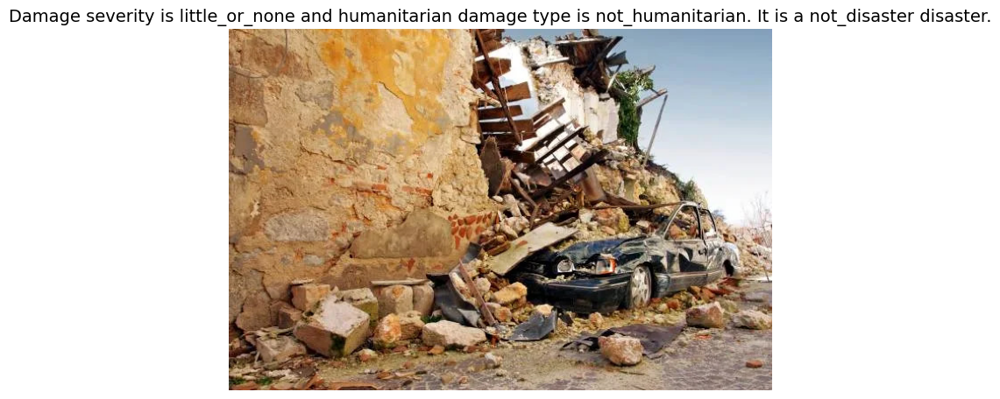

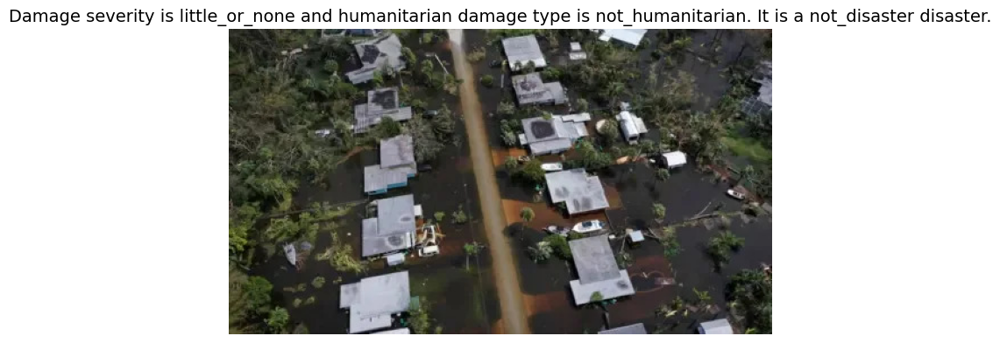

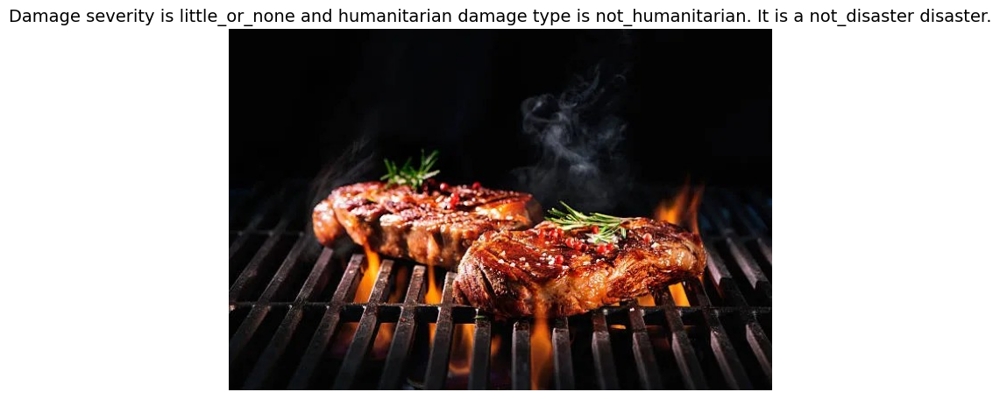

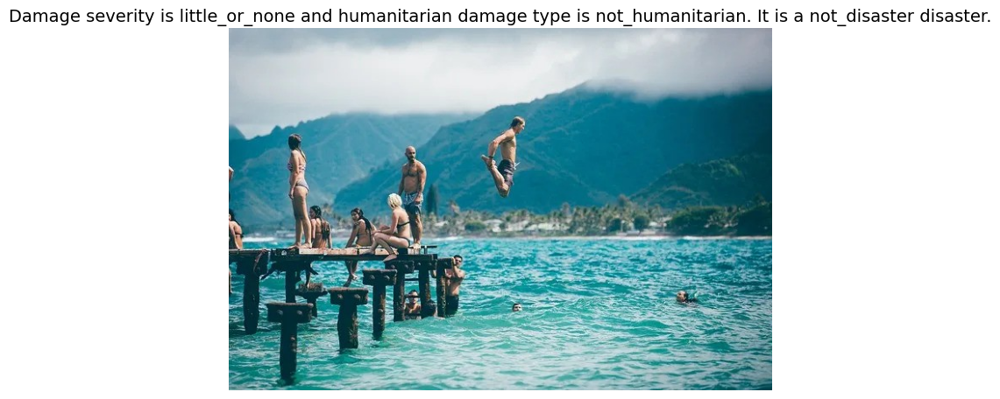

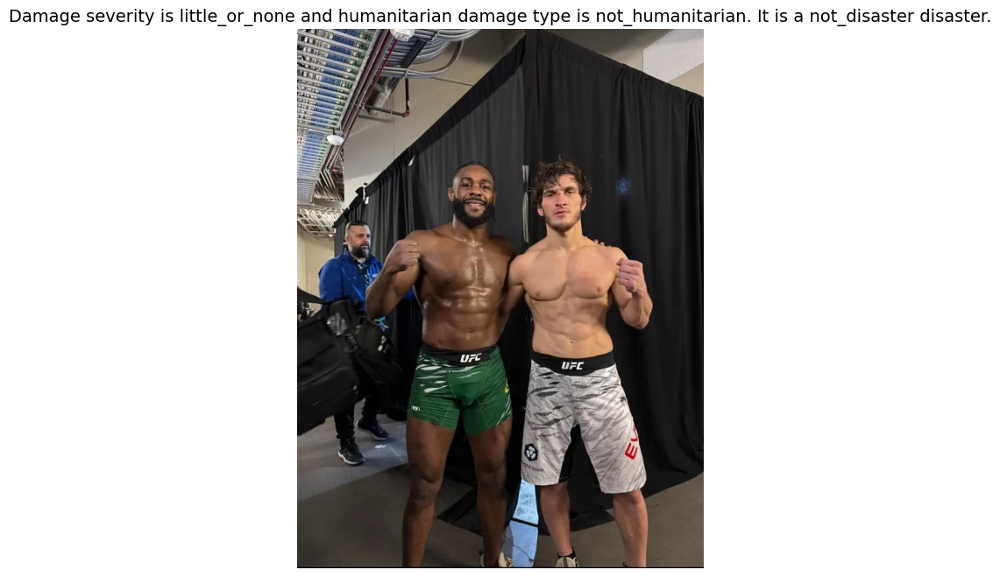

...

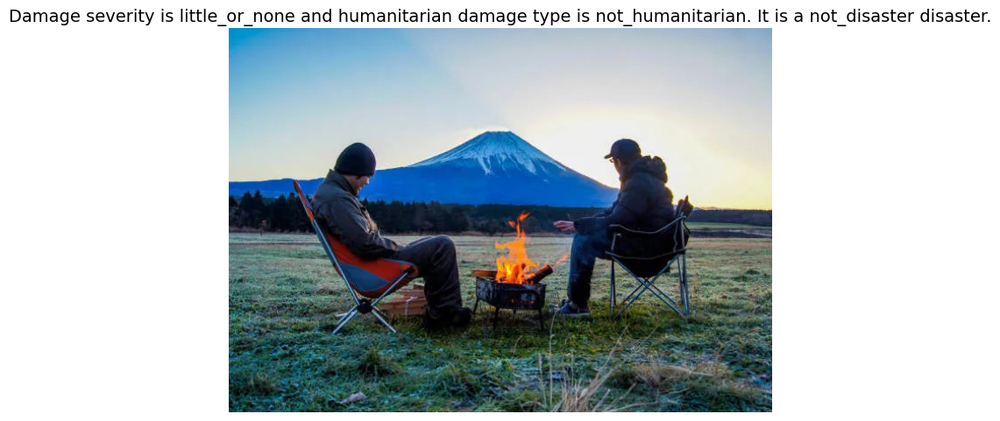

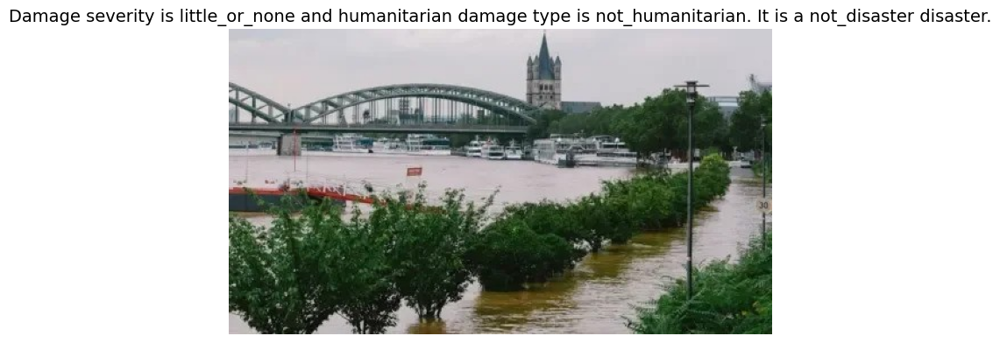

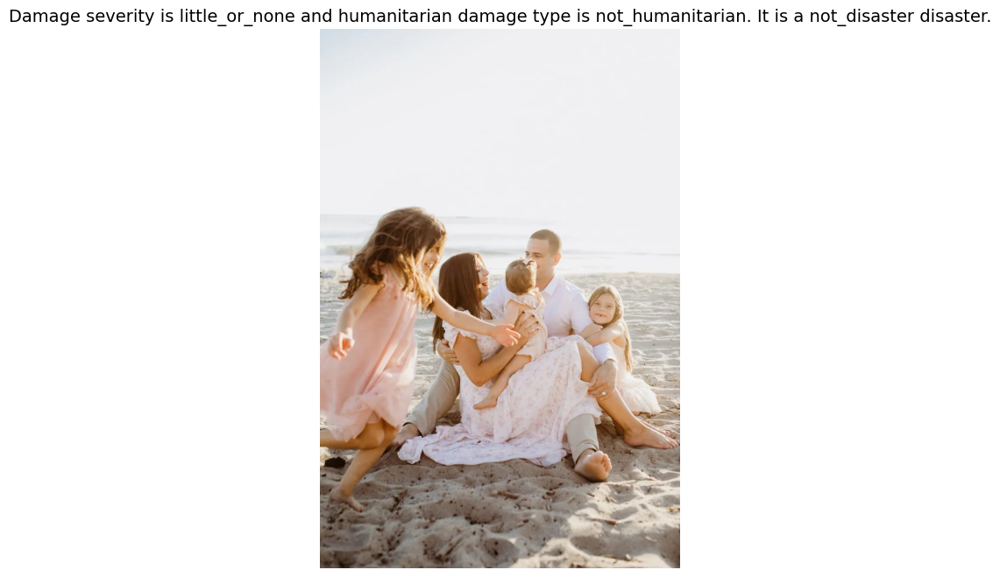

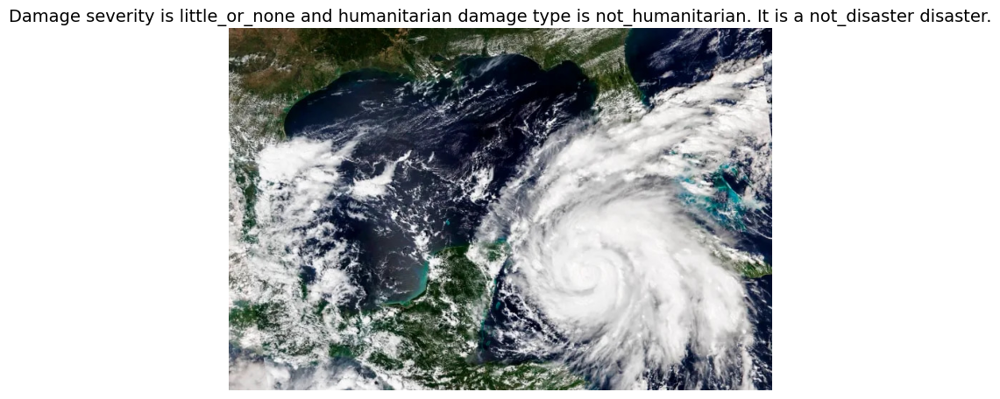

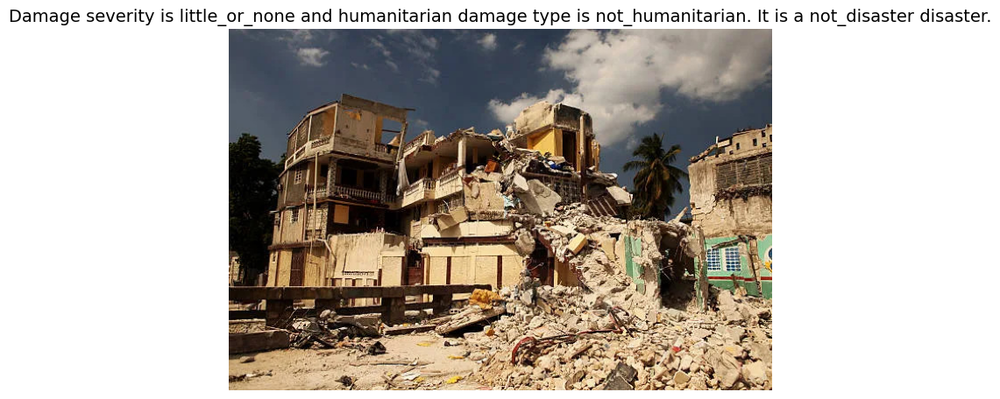

In [19]:
for filename in os.listdir(test_dir):
    if filename.lower().endswith(('.jpg', '.png', '.jpeg')):
        image_path = os.path.join(test_dir, filename)
        image = Image.open(image_path).convert('RGB')
        caption = generate_caption(model, image, tokenizer)
        
        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.title(caption, fontsize=14)
        plt.axis('off')
        plt.show()

In [21]:
annotations_test = []
with open('test_captions.txt', 'r', encoding='utf-8') as f:
    lines = f.readlines()
    lines = lines[1:]  # skip header
    for line in lines:
        line = line.strip()
        if not line:
            continue
        parts = line.split(',', 1)
        if len(parts) < 2:
            continue
        image_file, caption = parts[0].strip(), parts[1].strip()
        img_path = os.path.join('images_test', image_file)
        if os.path.isfile(img_path):
            annotations_test.append((img_path, caption))
        else:
            print(f"Warning: Image file {img_path} not found.")

print(f"Loaded {len(annotations_test)} annotations.")

Loaded 2626 annotations.


In [22]:
test_dataset = ImageCaptionDataset(annotations_test, img_transform, tokenizer, max_len=MAX_TEXT_LEN)

In [23]:
import math

In [ ]:
BATCH_SIZE = 1
DEVICE = 'mps' if torch.mps.is_available() else 'cpu'

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

model.eval() 
model.to(DEVICE)

total_loss = 0.0
num_batches = 0

with torch.no_grad():
    for images, tokens in test_dataloader:
        images = images.to(DEVICE)
        tokens = tokens.to(DEVICE)

        # Forward pass with labels to get loss
        outputs = model(images, tokens, labels=tokens)
        loss = outputs.loss
        total_loss += loss.item()
        num_batches += 1

# Compute average loss over the entire test set
avg_loss = total_loss / num_batches

# Compute perplexity
perplexity = math.exp(avg_loss)
print(f"Test Perplexity: {perplexity:.4f}")

Test Perplexity: 1.1183
